# Importing the usual suspects

In [1]:
import numpy as np
import pandas as pd
import os

# EDA tools
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

palette = sns.color_palette()

import plotly.offline as py
py.init_notebook_mode(connected=True) #Use plotly.js CDN
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
import cufflinks as cf
cf.set_config_file(offline=True)

In [2]:
DATA_DIR = './data/'

In [3]:
print('# File sizes')
for f in os.listdir(DATA_DIR):
    if not os.path.isdir(DATA_DIR + f):
        print(f.ljust(30) + str(round(os.path.getsize(DATA_DIR + f) / 1000000, 2)) + 'MB')
    else:
        sizes = [os.path.getsize(DATA_DIR+f+'/'+x)/1000000 for x in os.listdir(DATA_DIR + f)]
        print(f.ljust(30) + str(round(sum(sizes), 2)) + 'MB' + ' ({} files)'.format(len(sizes)))

# File sizes
.DS_Store                     0.01MB
census_income_learn.csv       103.87MB
census_income_metadata.txt    0.01MB
census_income_test.csv        51.92MB


# Loading the dataset

In [4]:
TRAIN_DATA = DATA_DIR + 'census_income_learn.csv'
TEST_DATA = DATA_DIR + 'census_income_test.csv'

In [5]:
df_train = pd.read_csv(TRAIN_DATA)
df_train.head()

,73,Not in universe,0,0.1,High school graduate,0.2,Not in universe.1,Widowed,Not in universe or children,Not in universe.2,...,United-States,United-States.1,United-States.2,Native- Born in the United States,0.7,Not in universe.8,2,0.8,95,- 50000.
0,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.
1,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,...,Vietnam,Vietnam,Vietnam,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,- 50000.
2,9,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.
3,10,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.
4,48,Private,40,10,Some college but no degree,1200,Not in universe,Married-civilian spouse present,Entertainment,Professional specialty,...,Philippines,United-States,United-States,Native- Born in the United States,2,Not in universe,2,52,95,- 50000.


Seems like there is no column name at all.
Copy pasting from the metadata file.

Use regular expression to replace "| COLNAME \t\t\t... CODE"
- match "| " with "^| "
- match any number of tabs with \t+
- match end of line with \n

In [6]:
col_name = ["age - AAGE",
"class of worker - ACLSWKR",
"industry code - ADTIND",
"occupation code - ADTOCC",
"adjusted gross income - AGI",
"education - AHGA",
"wage per hour - AHRSPAY",
"enrolled in edu inst last wk - AHSCOL",
"marital status - AMARITL",
"major industry code - AMJIND",
"major occupation code - AMJOCC",
"mace - ARACE",
"hispanic Origin - AREORGN",
"sex - ASEX",
"member of a labor union - AUNMEM",
"reason for unemployment - AUNTYPE",
"full or part time employment stat - AWKSTAT",
"capital gains - CAPGAIN",
"capital losses - CAPLOSS",
"divdends from stocks - DIVVAL",
"federal income tax liability - FEDTAX",
"tax filer status - FILESTAT",
"region of previous residence - GRINREG",
"state of previous residence - GRINST",
"detailed household and family stat - HHDFMX",
"detailed household summary in household - HHDREL",
"instance weight - MARSUPWT",
"migration code-change in msa - MIGMTR1",
"migration code-change in reg - MIGMTR3",
"migration code-move within reg - MIGMTR4",
"live in this house 1 year ago - MIGSAME",
"migration prev res in sunbelt - MIGSUN",
"num persons worked for employer - NOEMP",
"family members under 18 - PARENT",
"total person earnings - PEARNVAL",
"country of birth father - PEFNTVTY",
"country of birth mother - PEMNTVTY",
"country of birth self - PENATVTY",
"citizenship - PRCITSHP",
"total person income - PTOTVAL",
"own business or self employed - SEOTR",
"taxable income amount - TAXINC",
"fill inc questionnaire for veteran's admin - VETQVA",
"veterans benefits - VETYN",
"weeks worked in year - WKSWORK"]

In [7]:
df_train = pd.read_csv(TRAIN_DATA, names=col_name)
df_train.head(30)

,age - AAGE,class of worker - ACLSWKR,industry code - ADTIND,occupation code - ADTOCC,adjusted gross income - AGI,education - AHGA,wage per hour - AHRSPAY,enrolled in edu inst last wk - AHSCOL,marital status - AMARITL,major industry code - AMJIND,...,country of birth father - PEFNTVTY,country of birth mother - PEMNTVTY,country of birth self - PENATVTY,citizenship - PRCITSHP,total person income - PTOTVAL,own business or self employed - SEOTR,taxable income amount - TAXINC,fill inc questionnaire for veteran's admin - VETQVA,veterans benefits - VETYN,weeks worked in year - WKSWORK
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,...,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.,NaN,NaN,NaN
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.,NaN,NaN,NaN
2,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,...,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,- 50000.,NaN,NaN,NaN
3,9,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.,NaN,NaN,NaN
4,10,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.,NaN,NaN,NaN
5,48,Private,40,10,Some college but no degree,1200,Not in universe,Married-civilian spouse present,Entertainment,Professional specialty,...,Native- Born in the United States,2,Not in universe,2,52,95,- 50000.,NaN,NaN,NaN
6,42,Private,34,3,Bachelors degree(BA AB BS),0,Not in universe,Married-civilian spouse present,Finance insurance and real estate,Executive admin and managerial,...,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.,NaN,NaN,NaN
7,28,Private,4,40,High school graduate,0,Not in universe,Never married,Construction,Handlers equip cleaners etc,...,Native- Born in the United States,0,Not in universe,2,30,95,- 50000.,NaN,NaN,NaN
8,47,Local government,43,26,Some college but no degree,876,Not in universe,Married-civilian spouse present,Education,Adm support including clerical,...,Native- Born in the United States,0,Not in universe,2,52,95,- 50000.,NaN,NaN,NaN
9,34,Private,4,37,Some college but no degree,0,Not in universe,Married-civilian spouse present,Construction,Machine operators assmblrs & inspctrs,...,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.,NaN,NaN,NaN


Order of columns does not match (example wage per hour and the last 3 columns). Rechecking

In [8]:
col_name = ["age - AAGE",
"class of worker - ACLSWKR",
"industry code - ADTIND",
"occupation code - ADTOCC",
# "adjusted gross income - AGI", # Omitted in DATA
"education - AHGA",
"wage per hour - AHRSPAY",
"enrolled in edu inst last wk - AHSCOL",
"marital status - AMARITL",
"major industry code - AMJIND",
"major occupation code - AMJOCC",
"race - ARACE", # typo mace -> race
"hispanic Origin - AREORGN",
"sex - ASEX",
"member of a labor union - AUNMEM",
"reason for unemployment - AUNTYPE",
"full or part time employment stat - AWKSTAT",
"capital gains - CAPGAIN",
"capital losses - CAPLOSS",
"dividends from stocks - DIVVAL", # typo divdends --> dividends
# "federal income tax liability - FEDTAX",  # Omitted in DATA
"tax filer status - FILESTAT",
"region of previous residence - GRINREG",
"state of previous residence - GRINST",
"detailed household and family stat - HHDFMX",
"detailed household summary in household - HHDREL",
"instance weight - MARSUPWT",
"migration code-change in msa - MIGMTR1",
"migration code-change in reg - MIGMTR3",
"migration code-move within reg - MIGMTR4",
"live in this house 1 year ago - MIGSAME",
"migration prev res in sunbelt - MIGSUN",
"num persons worked for employer - NOEMP",
"family members under 18 - PARENT",
# "total person earnings - PEARNVAL",  # Omitted in DATA
"country of birth father - PEFNTVTY",
"country of birth mother - PEMNTVTY",
"country of birth self - PENATVTY",
"citizenship - PRCITSHP",
# "total person income - PTOTVAL",  # Omitted in DATA
"own business or self employed - SEOTR",
# "taxable income amount - TAXINC",  # Omitted in DATA
"fill inc questionnaire for veteran's admin - VETQVA",
"veterans benefits - VETYN",
"weeks worked in year - WKSWORK",
"year", # New added
"target - Income 50k"
]


df_train = pd.read_csv(TRAIN_DATA, names=col_name, index_col=False)
df_train.head(30)

,age - AAGE,class of worker - ACLSWKR,industry code - ADTIND,occupation code - ADTOCC,education - AHGA,wage per hour - AHRSPAY,enrolled in edu inst last wk - AHSCOL,marital status - AMARITL,major industry code - AMJIND,major occupation code - AMJOCC,...,country of birth father - PEFNTVTY,country of birth mother - PEMNTVTY,country of birth self - PENATVTY,citizenship - PRCITSHP,own business or self employed - SEOTR,fill inc questionnaire for veteran's admin - VETQVA,veterans benefits - VETYN,weeks worked in year - WKSWORK,year,target - Income 50k
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.
2,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,...,Vietnam,Vietnam,Vietnam,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,- 50000.
3,9,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.
4,10,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.
5,48,Private,40,10,Some college but no degree,1200,Not in universe,Married-civilian spouse present,Entertainment,Professional specialty,...,Philippines,United-States,United-States,Native- Born in the United States,2,Not in universe,2,52,95,- 50000.
6,42,Private,34,3,Bachelors degree(BA AB BS),0,Not in universe,Married-civilian spouse present,Finance insurance and real estate,Executive admin and managerial,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.
7,28,Private,4,40,High school graduate,0,Not in universe,Never married,Construction,Handlers equip cleaners etc,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,30,95,- 50000.
8,47,Local government,43,26,Some college but no degree,876,Not in universe,Married-civilian spouse present,Education,Adm support including clerical,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,95,- 50000.
9,34,Private,4,37,Some college but no degree,0,Not in universe,Married-civilian spouse present,Construction,Machine operators assmblrs & inspctrs,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.


# Explorative Data Analysis

Plotting bar chart for categoricals
and histograms for continuous variables

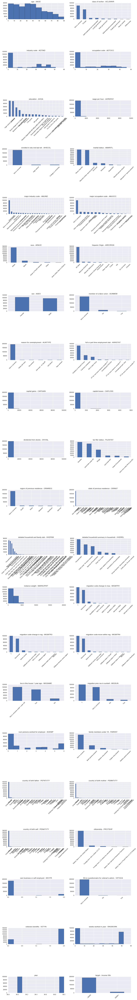

In [9]:
fig = plt.figure(figsize=(15,120))
cols = 2
rows = np.ceil(df_train.shape[1] / cols)


for i, column in enumerate(df_train.columns):
    ax = fig.add_subplot(rows, cols, i + 1)
    ax.set_title(column)
    if df_train.dtypes[column] == np.object:
        df_train[column].value_counts().plot(kind="bar", axes=ax)
        plt.xticks(rotation=45)
    else:
        df_train[column].hist(axes=ax)
        # plt.xticks(rotation=45)
plt.subplots_adjust(hspace=2, wspace=0.2)

## Distribution and heatmap of continuous variables

In [10]:
df_train.describe()

,age - AAGE,industry code - ADTIND,occupation code - ADTOCC,wage per hour - AHRSPAY,capital gains - CAPGAIN,capital losses - CAPLOSS,dividends from stocks - DIVVAL,instance weight - MARSUPWT,num persons worked for employer - NOEMP,own business or self employed - SEOTR,veterans benefits - VETYN,weeks worked in year - WKSWORK,year
count,199523.000000,199523.000000,199523.000000,199523.000000,199523.00000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000
mean,34.494199,15.352320,11.306556,55.426908,434.71899,37.313788,197.529533,1740.380269,1.956180,0.175438,1.514833,23.174897,94.499672
std,22.310895,18.067129,14.454204,274.896454,4697.53128,271.896428,1984.163658,993.768156,2.365126,0.553694,0.851473,24.411488,0.500001
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,37.870000,0.000000,0.000000,0.000000,0.000000,94.000000
25%,15.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1061.615000,0.000000,0.000000,2.000000,0.000000,94.000000
50%,33.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1618.310000,1.000000,0.000000,2.000000,8.000000,94.000000
75%,50.000000,33.000000,26.000000,0.000000,0.00000,0.000000,0.000000,2188.610000,4.000000,0.000000,2.000000,52.000000,95.000000
max,90.000000,51.000000,46.000000,9999.000000,99999.00000,4608.000000,99999.000000,18656.300000,6.000000,2.000000,2.000000,52.000000,95.000000


In [11]:
df_train.corr().iplot(kind='heatmap', colorscale='GnBu')

## Zoom on target label

Unfortunately Plot.ly has issues with the target values and interpret them as real

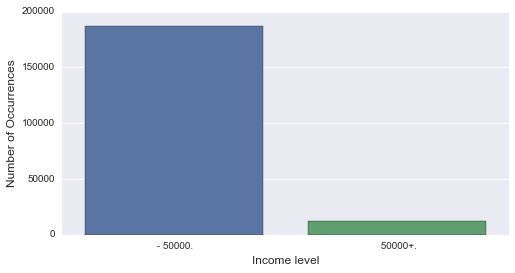

In [12]:
inc_level = df_train['target - Income 50k'].value_counts()

plt.figure(figsize=(8,4))
sns.barplot(inc_level.index, inc_level.values)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Income level', fontsize=12)
plt.show()

## Zoom on specific features

### Worker class

In [13]:
df_train['class of worker - ACLSWKR'].value_counts().iplot(kind='bar', title='Class of Workers')

/usr/local/lib/python3.5/site-packages/cufflinks/plotlytools.py:156: FutureWarning:

pandas.tslib is deprecated and will be removed in a future version.
You can access Timestamp as pandas.Timestamp



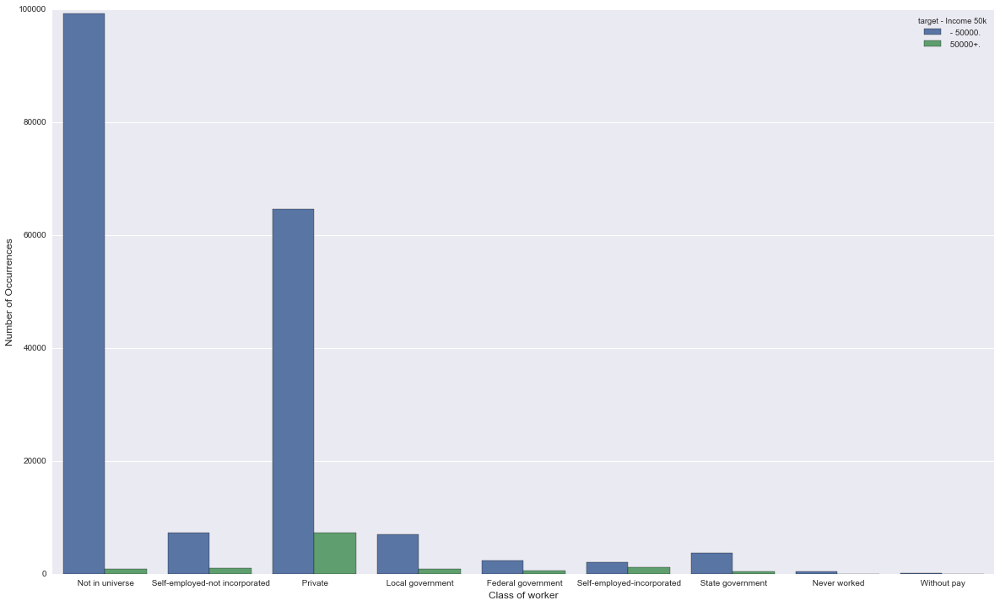

In [14]:
plt.figure(figsize=(20,12))
sns.countplot(x='class of worker - ACLSWKR', hue='target - Income 50k', data=df_train)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Class of worker', fontsize=12)
plt.show()

# Feature selection
Trees ensemble like XGBoost and RandomForest have the huge advantage of not needing scaling can deal with multicollinearity and with missing data without imputation

We use them to get some sense of the most important features

In [15]:
from sklearn import preprocessing
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelBinarizer, RobustScaler, Binarizer, StandardScaler, OneHotEncoder
from sklearn_pandas import DataFrameMapper
from sklearn.ensemble import ExtraTreesClassifier

In [16]:
# Custom label binarizer for binary variables
# Needed otherwise the Sex column gives only 1 feature instead of 2 and I can't check the top features'
class LabelBinForBinaryVal(LabelBinarizer):
    def transform(self, y):
        Y = super().transform(y)
        if self.y_type_ == 'binary':
            return np.hstack((Y, 1-Y))
        else:
            return Y

    def inverse_transform(self, Y, threshold=None):
        if self.y_type_ == 'binary':
            return super().inverse_transform(Y[:, 0], threshold)
        else:
            return super().inverse_transform(Y, threshold)

In [17]:
# Map transformations to dataframe columns

mapper1 = DataFrameMapper([
    ("age - AAGE", None), 
    ("class of worker - ACLSWKR", LabelBinarizer()), 
    ("industry code - ADTIND", None), 
    ("occupation code - ADTOCC", None), 
    ("education - AHGA", LabelBinarizer()), 
    ("wage per hour - AHRSPAY", None), 
    ("enrolled in edu inst last wk - AHSCOL", LabelBinarizer()), 
    ("marital status - AMARITL", LabelBinarizer()), 
    ("major industry code - AMJIND", LabelBinarizer()), 
    ("major occupation code - AMJOCC", LabelBinarizer()), 
    ("race - ARACE", LabelBinarizer()), 
    ("hispanic Origin - AREORGN", LabelBinarizer()), 
    ("sex - ASEX", LabelBinForBinaryVal()), 
    ("member of a labor union - AUNMEM", LabelBinarizer()), 
    ("reason for unemployment - AUNTYPE", LabelBinarizer()), 
    ("full or part time employment stat - AWKSTAT", LabelBinarizer()), 
    ("capital gains - CAPGAIN", None), 
    ("capital losses - CAPLOSS", None), 
    ("dividends from stocks - DIVVAL", None), 
    ("tax filer status - FILESTAT", LabelBinarizer()), 
    ("region of previous residence - GRINREG", LabelBinarizer()), 
    ("state of previous residence - GRINST", LabelBinarizer()), 
    ("detailed household and family stat - HHDFMX", LabelBinarizer()), 
    ("detailed household summary in household - HHDREL", LabelBinarizer()), 
    ("instance weight - MARSUPWT", None), 
    ("migration code-change in msa - MIGMTR1", LabelBinarizer()), 
    ("migration code-change in reg - MIGMTR3", LabelBinarizer()), 
    ("migration code-move within reg - MIGMTR4", LabelBinarizer()), 
    ("live in this house 1 year ago - MIGSAME", LabelBinarizer()), 
    ("migration prev res in sunbelt - MIGSUN", LabelBinarizer()), 
    ("num persons worked for employer - NOEMP", None), 
    ("family members under 18 - PARENT", LabelBinarizer()), 
    ("country of birth father - PEFNTVTY", LabelBinarizer()), 
    ("country of birth mother - PEMNTVTY", LabelBinarizer()), 
    ("country of birth self - PENATVTY", LabelBinarizer()), 
    ("citizenship - PRCITSHP", LabelBinarizer()), 
    ("own business or self employed - SEOTR", None), 
    ("fill inc questionnaire for veteran's admin - VETQVA", LabelBinarizer()), 
    ("veterans benefits - VETYN", None), 
    ("weeks worked in year - WKSWORK", None), 
    ("year", None)
])

In [18]:
# Create the transformation pipeline

pipe1 = Pipeline([
    ("featurize", mapper1),
    ("forest", ExtraTreesClassifier(
        n_estimators=30,
        max_depth = 4,
        n_jobs=-1))
    ])

In [19]:
####### Get top features and noise #######
def top_feat(pipe):
    dummy, model = pipe.steps[-1]

    feature_list = []
    for feature in pipe.named_steps['featurize'].features:
        if isinstance(feature[1], OneHotEncoder):
            for feature_value in feature[1].active_features_: #For LabelBinarizer
                feature_list.append(feature[0][0]+'_'+str(feature_value))
        else:
            try:
                for feature_value in feature[1].classes_: #For LabelBinarizer and LabelBinForBinaryVal
                    feature_list.append(feature[0]+'_'+feature_value)
            except:
                feature_list.append(feature[0])


    # # Can't do the following with Binarizers and Label Binarizers due to change in columns
    top_features = pd.DataFrame({'feature':feature_list,'importance':np.round(model.feature_importances_,3)})
    top_features = top_features.sort_values('importance',ascending=False).set_index('feature')
    top_features.to_csv('top_features.csv')
    top_features.plot.bar()

In [20]:
## Fit data

X_train = df_train
y_train = df_train['target - Income 50k']

pipe1.fit(X_train, y_train)

Pipeline(steps=[('featurize', DataFrameMapper(default=False, df_out=False,
        features=[('age - AAGE', None, {}), ('class of worker - ACLSWKR', LabelBinarizer(neg_label=0, pos_label=1, sparse_output=False), {}), ('industry code - ADTIND', None, {}), ('occupation code - ADTOCC', None, {}), ('education - ...imators=30, n_jobs=-1, oob_score=False, random_state=None,
           verbose=0, warm_start=False))])

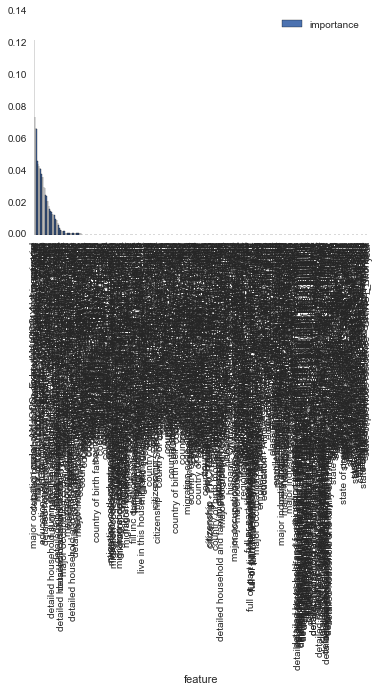

In [21]:
## Generate top features

top_feat(pipe1)

The plot is unreadable because of the number of features, let's display the top 20 features from the csv we saved.

In [22]:
top_feats = pd.read_csv('top_features.csv')
top_feats.head(20)

,feature,importance
0,major occupation code - AMJOCC_ Executive admi...,0.122
1,major occupation code - AMJOCC_ Not in universe,0.074
2,detailed household and family stat - HHDFMX_ H...,0.067
3,weeks worked in year - WKSWORK,0.066
4,capital gains - CAPGAIN,0.046
5,major occupation code - AMJOCC_ Professional s...,0.044
6,num persons worked for employer - NOEMP,0.043
7,major industry code - AMJIND_ Not in universe ...,0.042
8,sex - ASEX_ Female,0.041
9,marital status - AMARITL_ Never married,0.038


We will work with:
- major occupation code - AMJOCC
- weeks worked in year - WKSWORK
- detailed household and family stat - HHDFMX
- sex - ASEX
- major industry code - AMJIND
- education - AHGA
- class of worker - ACLSWKR
- occupation code - ADTOCC
- tax filer status - FILESTAT
- age - AAGE
- num persons worked for employer - NOEMP
- detailed household summary in household - HHDREL

# Feature engineering

We have the wage per hour and the number of weeks worked in year.

Let's create a new feature "estimated_salary" supposing 9 to 5 work day, 5 days/week

In [23]:
from sklearn.base import BaseEstimator, TransformerMixin


In [24]:
class EstimatedSalaryTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, X, y=None, **fit_params):
        return self
    
    def transform(self, X, **transform_params):
        df = pd.DataFrame(X) #if using X directly it thinks it's a list ... dynamic typing ...
        return df.assign(
            estimated_salary = df['wage per hour - AHRSPAY'] * 8 * 5 * df['weeks worked in year - WKSWORK']
        )

# Validation

In [25]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, StratifiedKFold
from xgboost import XGBClassifier

# Cross val generate DataConversion warnings and DeprecationWarning
# Ignore them
import warnings

In [26]:
##### Cross Validation function
def crossval(pipe, X_train, y_train, folds):
    cv = cross_val_score(pipe, X_train, y_train, cv=folds)
    print("Cross Validation Scores are: ", cv.round(3))
    print("Mean CrossVal score is: ", round(cv.mean(),3))
    print("Std Dev CrossVal score is: ", round(cv.std(),3))

In [27]:
# Folds

folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

## Using logistic regression

In [28]:
mapper_logreg = DataFrameMapper([
    ('major occupation code - AMJOCC', LabelBinarizer()),
    (['weeks worked in year - WKSWORK'], StandardScaler()),
    ('detailed household and family stat - HHDFMX', LabelBinarizer()),
    ("sex - ASEX", LabelBinForBinaryVal()), 
    ('major industry code - AMJIND', LabelBinarizer()),
    ('education - AHGA', LabelBinarizer()),
    ('class of worker - ACLSWKR', LabelBinarizer()),
    (['occupation code - ADTOCC'], OneHotEncoder()),
    ('tax filer status - FILESTAT',LabelBinarizer()),
    (['age - AAGE'], StandardScaler()),
    (['num persons worked for employer - NOEMP'], StandardScaler()),
    ('detailed household summary in household - HHDREL',LabelBinarizer()),
    (['estimated_salary'], StandardScaler())
])

In [29]:
pipe_logreg = Pipeline([
    ("estim_salary", EstimatedSalaryTransformer()),
    ("featurize", mapper_logreg),
    ("logreg", LogisticRegression(
        class_weight='balanced',
        n_jobs=-1))
    ])

In [30]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    crossval(pipe_logreg, X_train, y_train, folds)

Cross Validation Scores are:  [ 0.837  0.834  0.832  0.831  0.834]
Mean CrossVal score is:  0.834
Std Dev CrossVal score is:  0.002


## Using gradient boosted trees

We use a simple XGBoost (no early stopping)

In [31]:
mapper_xgboost = DataFrameMapper([
    ('major occupation code - AMJOCC', LabelBinarizer()),
    (['weeks worked in year - WKSWORK'], None),
    ('detailed household and family stat - HHDFMX', LabelBinarizer()),
    ("sex - ASEX", LabelBinForBinaryVal()), 
    ('major industry code - AMJIND', LabelBinarizer()),
    ('education - AHGA', LabelBinarizer()),
    ('class of worker - ACLSWKR', LabelBinarizer()),
    (['occupation code - ADTOCC'], None),
    ('tax filer status - FILESTAT',LabelBinarizer()),
    (['age - AAGE'], None),
    (['num persons worked for employer - NOEMP'], None),
    ('detailed household summary in household - HHDREL',LabelBinarizer()),
    (['estimated_salary'], None)
])

In [32]:
pipe_xgboost = Pipeline([
    ("estim_salary", EstimatedSalaryTransformer()),
    ("featurize", mapper_xgboost),
    ("xgboost", XGBClassifier(
        n_estimators=1000, # This should be determined by early stopping and a validation set
        min_child_weight=1,
        max_depth=4,
        learning_rate=0.1,
        subsample = 0.7,
        colsample_bytree = 0.5,
        seed = 1337,
        tree_method = 'hist',
        n_jobs = -1
        ))
    ])

In [33]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    crossval(pipe_xgboost, X_train, y_train, folds)

Cross Validation Scores are:  [ 0.95   0.949  0.95   0.95   0.951]
Mean CrossVal score is:  0.95
Std Dev CrossVal score is:  0.001


# Prediction / test

Loading the test set

In [34]:
df_test = pd.read_csv(TEST_DATA, names=col_name, index_col=False)
df_test.head()

,age - AAGE,class of worker - ACLSWKR,industry code - ADTIND,occupation code - ADTOCC,education - AHGA,wage per hour - AHRSPAY,enrolled in edu inst last wk - AHSCOL,marital status - AMARITL,major industry code - AMJIND,major occupation code - AMJOCC,...,country of birth father - PEFNTVTY,country of birth mother - PEMNTVTY,country of birth self - PENATVTY,citizenship - PRCITSHP,own business or self employed - SEOTR,fill inc questionnaire for veteran's admin - VETQVA,veterans benefits - VETYN,weeks worked in year - WKSWORK,year,target - Income 50k
0,38,Private,6,36,1st 2nd 3rd or 4th grade,0,Not in universe,Married-civilian spouse present,Manufacturing-durable goods,Machine operators assmblrs & inspctrs,...,Mexico,Mexico,Mexico,Foreign born- Not a citizen of U S,0,Not in universe,2,12,95,- 50000.
1,44,Self-employed-not incorporated,37,12,Associates degree-occup /vocational,0,Not in universe,Married-civilian spouse present,Business and repair services,Professional specialty,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,26,95,- 50000.
2,2,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,95,- 50000.
3,35,Private,29,3,High school graduate,0,Not in universe,Divorced,Transportation,Executive admin and managerial,...,United-States,United-States,United-States,Native- Born in the United States,2,Not in universe,2,52,94,- 50000.
4,49,Private,4,34,High school graduate,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,50,95,- 50000.


## Fitting the model to the whole train data

In [35]:
pipe_logreg.fit(X_train,y_train)

/usr/local/lib/python3.5/site-packages/sklearn/utils/validation.py:429: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



Pipeline(steps=[('estim_salary', EstimatedSalaryTransformer()), ('featurize', DataFrameMapper(default=False, df_out=False,
        features=[('major occupation code - AMJOCC', LabelBinarizer(neg_label=0, pos_label=1, sparse_output=False), {}), (['weeks worked in year - WKSWORK'], StandardScaler(copy=True, wi...ty='l2', random_state=None,
          solver='liblinear', tol=0.0001, verbose=0, warm_start=False))])

In [36]:
pipe_xgboost.fit(X_train,y_train)

Pipeline(steps=[('estim_salary', EstimatedSalaryTransformer()), ('featurize', DataFrameMapper(default=False, df_out=False,
        features=[('major occupation code - AMJOCC', LabelBinarizer(neg_label=0, pos_label=1, sparse_output=False), {}), (['weeks worked in year - WKSWORK'], None, {}), ('detailed househ...eg_lambda=1, scale_pos_weight=1,
       seed=1337, silent=True, subsample=0.7, tree_method='hist'))])

## Scoring our models

In [37]:
pipe_logreg.score(df_test,df_test['target - Income 50k'])

/usr/local/lib/python3.5/site-packages/sklearn/utils/validation.py:429: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



0.83317295162486715

In [38]:
pipe_xgboost.score(df_test,df_test['target - Income 50k'])

0.9512339367695114